In [ ]:
! pip install konlpy

In [ ]:
! pip install kiwipiepy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.7/34.7 MB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 27.1 MB/s eta 0:00:00
  Created wheel for kiwipiepy_model: filename=kiwipiepy_model-0.20.0-py3-none-any.whl size=34818026 sha256=960c957143ba777cb5b7020025883384ac3a8c859e40c4a80855418efb5330f6
  Stored in directory: /root/.cache/pip/wheels/ca/c8/52/3a539d6e9065b191fe1c215e0203dcc3e00601c0e3d3d39824
Successfully built kiwipiepy_model


In [ ]:
import pandas as pd
import numpy as np
import re
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
import ast
#from kiwipiepy import Kiwi
from nltk.tokenize import word_tokenize
from nltk import pos_tag
import pickle

In [ ]:
# 1. 데이터 불러오기
file_path = "concat.csv"
#file_path = "concat_all_delete.csv"
raw_data = pd.read_csv(file_path)
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32534 entries, 0 to 32533
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  32533 non-null  object 
 1   date                   32534 non-null  float64
 2   keywords               31729 non-null  object 
 3   abstract               13780 non-null  object 
 4   multilingual_abstract  31940 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.2+ MB


In [ ]:
print(len(raw_data['title']))
raw_data.isna().sum()

32534


,0
title,1
date,0
keywords,805
abstract,18754
multilingual_abstract,594


In [ ]:
raw_data = raw_data.dropna(subset = ['abstract'])
word_data = raw_data.drop_duplicates(subset=['abstract']).reset_index(drop=True)
print(len(word_data['title']))
print(word_data.isna().sum())

13668
title                      1
date                       0
keywords                  59
abstract                   0
multilingual_abstract    591
dtype: int64


In [ ]:
# 2. 키워드 전처리 함수
def clean_keyword_list(keyword_str):
    try:
        keyword_list = ast.literal_eval(keyword_str)  # 문자열을 리스트로 변환
        if isinstance(keyword_list, list):
            return [kw for kw in keyword_list if kw and kw != "None"]  # None 값 제거
    except:
        return []
    return []

In [ ]:
# 3. 결측치 처리
word_data["keywords"] = word_data["keywords"].astype(str).apply(clean_keyword_list)

In [ ]:
import pandas as pd
import ast
import re
from collections import Counter

# CSV 파일 로드
df = pd.read_csv(file_path)

# NaN 값 제거
df = df.dropna(subset=["keywords"])

# 키워드 정리 함수: 특수문자 제거, 소문자로 변환
def clean_keyword(keyword):
    keyword = re.sub(r"[^\w\s]", "", keyword)  # 특수 문자 제거
    return keyword.lower().strip()  # 소문자로 변환

# 키워드 리스트 변환 및 정리
all_keywords = []
for keyword_str in df["keywords"]:
    if isinstance(keyword_str, str):
        try:
            keyword_list = ast.literal_eval(keyword_str)  # 문자열을 리스트로 변환
            cleaned_keywords = [clean_keyword(k) for k in keyword_list]  # 키워드 정리
            all_keywords.extend(cleaned_keywords)
        except (SyntaxError, ValueError):
            pass  # 변환 에러 방지

# 키워드 등장 횟수 계산
keyword_counts = Counter(all_keywords)

# 5회 이상 등장한 키워드 필터링
frequent_keywords = {k: v for k, v in keyword_counts.items() if v >= 5}

# 결과 출력
print("키워드 개수:", keyword_counts)
print("5회 이상 등장한 키워드:", frequent_keywords)


키워드 개수: Counter({'deep learning': 5720, '딥러닝': 1983, 'machine learning': 1280, 'artificial intelligence': 988, 'cnn': 821, '인공지능': 733, 'convolutional neural network': 658, 'lstm': 656, 'object detection': 573, 'ai': 298, 'deep neural network': 292, 'yolo': 267, '합성곱 신경망': 265, 'bert': 265, '머신러닝': 254, 'computer vision': 246, 'classification': 238, 'transfer learning': 238, '': 231, '조직몰입': 231, 'reinforcement learning': 213, 'deeplearning': 211, 'transformer': 210, 'gan': 201, 'digital transformation': 201, 'data augmentation': 185, '변혁적 리더십': 182, '기계학습': 181, '딥 러닝': 175, 'autoencoder': 173, 'neural network': 173, 'anomaly detection': 169, 'big data': 168, 'convolutional neural networks': 167, 'natural language processing': 160, 'image classification': 159, 'organizational commitment': 159, 'image processing': 157, 'transformational leadership': 156, 'unet': 155, 'artificial neural network': 154, '직무만족': 154, 'semantic segmentation': 153, 'covid19': 145, 'deep reinforcement learnin

In [ ]:
print("키워드 개수:", keyword_counts)

키워드 개수: Counter({'deep learning': 5720, '딥러닝': 1983, 'machine learning': 1280, 'artificial intelligence': 988, 'cnn': 821, '인공지능': 733, 'convolutional neural network': 658, 'lstm': 656, 'object detection': 573, 'ai': 298, 'deep neural network': 292, 'yolo': 267, '합성곱 신경망': 265, 'bert': 265, '머신러닝': 254, 'computer vision': 246, 'classification': 238, 'transfer learning': 238, '': 231, '조직몰입': 231, 'reinforcement learning': 213, 'deeplearning': 211, 'transformer': 210, 'gan': 201, 'digital transformation': 201, 'data augmentation': 185, '변혁적 리더십': 182, '기계학습': 181, '딥 러닝': 175, 'autoencoder': 173, 'neural network': 173, 'anomaly detection': 169, 'big data': 168, 'convolutional neural networks': 167, 'natural language processing': 160, 'image classification': 159, 'organizational commitment': 159, 'image processing': 157, 'transformational leadership': 156, 'unet': 155, 'artificial neural network': 154, '직무만족': 154, 'semantic segmentation': 153, 'covid19': 145, 'deep reinforcement learnin

In [ ]:
word_data_list = word_data['abstract'].tolist() + word_data['keywords'].tolist()

In [ ]:
print(len(word_data['title']))
print(word_data.isna().sum())

13668
title                      1
date                       0
keywords                   0
abstract                   0
multilingual_abstract    591
dtype: int64


In [ ]:
yearly_counts = word_data['date'].value_counts().sort_index()
print(yearly_counts)

date
2015.00    281
2015.02      1
2015.06      2
2015.08      2
2015.09      3
          ... 
2024.50     26
2024.60     69
2024.70     15
2024.80     26
2024.90     23
Name: count, Length: 193, dtype: int64


In [ ]:
year = []
for i in word_data['date']:
  year.append(int(i))

In [ ]:
import collections
count = {}
count = collections.Counter(year)
print(count)

Counter({2024: 1993, 2023: 1868, 2022: 1859, 2021: 1568, 2020: 1502, 2019: 1325, 2018: 1134, 2017: 940, 2015: 753, 2016: 726})


In [ ]:
test = 'cnn을 이용한 파이썬'
cleaned_text = None
cleaned_text = re.sub(r'[^A-Za-z가-힣\s]', '', test)
print(cleaned_text)

cnn을 이용한 파이썬


In [ ]:
# Kiwi & NLTK 설정
kiwi = Kiwi()
kiwi.add_user_word("하이퍼파라미터", "NNG")
kiwi.add_user_word("거버넌스", "NNG")
kiwi.add_user_word("팔로워십", "NNG")
nltk.data.path.append('/root/nltk_data')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('stopwords')
stopwords = set(nltk.corpus.stopwords.words("english"))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def extract_tokens(text):
    # 문자열이 아닌 경우 빈 리스트 반환
    if not isinstance(text, str) or pd.isna(text):
        return []

    # 영어 불용어 제거
    pre_eng = " ".join(re.findall(r"[a-zA-Z]+", text))
    eng_words = word_tokenize(pre_eng)
    eng_tag_words = pos_tag(eng_words)

    english_words = [word.lower() for word, tag in eng_tag_words if tag in ['NN', 'NNS', 'NNP', 'NNPS'] and word.lower() not in stopwords]

    # 한글 명사 추출 (연속된 형태 유지)
    korean_words = [''.join(token.form) for token in kiwi.tokenize(text) if token.tag in ['NNG', 'NNP'] and token.len > 1]

    return english_words + korean_words

In [ ]:
# 토큰화 처리 (빈 리스트 필터링)
token_list = []
for data in word_data_list:
    # 리스트 안에 또 다른 리스트가 있을 경우 내부 요소를 처리
    if isinstance(data, list):
        for item in data:
            tokens = extract_tokens(item)
            if tokens:  # 빈 리스트가 아니면 추가
                token_list.append(tokens)
    else:
        tokens = extract_tokens(data)
        if tokens:  # 빈 리스트가 아니면 추가
            token_list.append(tokens)

In [ ]:
print(token_list[:5])

[['bert', 'transformer', 'bert', 'oov', 'vocabulary', 'bpe', 'byte', 'pair', 'encoding', 'layer', 'fine', 'bert', 'bert', 'rnn', 'bert', 'rnn', 'state', 'inference', '최근', '자연어 처리', '분야', '성능', '향상', '방향', '트랜스포머', '기반', '모델', '문제', '해결', '적용', '기반', '언어', '모델', '사전', '학습', '출력', '추가', '자연어 처리', '태스크', '감성', '분석', '문장', '잠재', '의미', '분석', '분류', '문제', '논문', '감성', '분석', '생성', '토큰', '표현', '이용', '용량', '한국어', '코퍼스', '언어', '모델', '학습', '모델', '사용', '문맥', '정보', '인코딩', '사용', '방법', '인코딩', '이용', '감성', '분석', '수행', '방법', '제안'], ['bert', '인공', '지능', '연구', '이미지', '영상', '자연어 처리', '다양', '분야', '적용', '자연어 처리', '분야', '사람', '언어', '컴퓨터', '이해', '연구', '진행', '인공', '지능', '기술', '중요', '영역', '자연어 처리', '컴퓨터', '사람', '상식', '이해', '학습', '사람', '상식', '기반', '결과', '생성', '중요', '기술', '단어', '관계', '이용', '연결', '지식', '그래프', '컴퓨터', '상식', '학습', '장점', '기존', '고안', '지식', '그래프', '특정', '언어', '분야', '집중', '구성', '신조어', '대응', '한계점', '논문', '실시간', '데이터', '수집', '분석', '자동', '확장', '가능', '지식', '그래프', '구축', '기반', '데이터', '활용', '챗봇', '시스템', '제안', '자동

In [ ]:
from nltk.stem import WordNetLemmatizer

def extract_tokens(text):
    # 문자열이 아닌 경우 빈 리스트 반환
    if not isinstance(text, str) or pd.isna(text):
        return []

    lemmatizer = WordNetLemmatizer()

    # 영어 불용어 제거
    pre_eng = " ".join(re.findall(r"[a-zA-Z]+", text))
    eng_words = word_tokenize(pre_eng)
    eng_tag_words = pos_tag(eng_words)

    english_words = [lemmatizer.lemmatize(word.lower()) for word, tag in eng_tag_words
                     if tag in ['NN', 'NNS', 'NNP', 'NNPS'] and word.lower() not in stopwords]

    # 한글 명사 추출 (연속된 형태 유지)
    korean_words = [''.join(token.form) for token in kiwi.tokenize(text)
                    if token.tag in ['NNG', 'NNP'] and token.len > 1]

    return " ".join(english_words + korean_words)


In [ ]:
def extract_tokens(text):
    # 문자열이 아닌 경우 빈 리스트 반환
    if not isinstance(text, str) or pd.isna(text):
        return []

    # 영어 불용어 제거
    pre_eng = " ".join(re.findall(r"[a-zA-Z]+", text))
    eng_words = word_tokenize(pre_eng)
    eng_tag_words = pos_tag(eng_words)

    english_words = [word.lower() for word, tag in eng_tag_words if tag in ['NN', 'NNS', 'NNP', 'NNPS'] and word.lower() not in stopwords]

    # 한글 명사 추출 (연속된 형태 유지)
    korean_words = [''.join(token.form) for token in kiwi.tokenize(text) if token.tag in ['NNG', 'NNP'] and token.len > 1]

    return " ".join(english_words + korean_words)

In [ ]:
processed_texts = []
for data in word_data_list:
    if isinstance(data, list):
        # 리스트 내부 요소를 문자열로 변환 후 하나의 문자열로 결합
        text = " ".join([extract_tokens(str(item)) for item in data])
    else:
        text = extract_tokens(str(data))
    processed_texts.append(text)

In [ ]:
with open("processed_texts.pkl","wb") as f:
    pickle.dump(processed_texts, f)

In [ ]:
with open("processed_texts.pkl","rb") as f:
    processed_texts = pickle.load(f)

In [ ]:
# 영어 단어만 추출하는 함수
def extract_english_words(text):
    return re.findall(r'\b[a-zA-Z]+\b', text)

# 데이터가 리스트 형태라고 가정하고 처리
english_words = []
if isinstance(processed_texts, list):
    for item in processed_texts:
        if isinstance(item, str):  # 문자열인지 확인
            english_words.extend(extract_english_words(item))

# 중복 제거 후 정렬
english_words = sorted(set(english_words))

# 결과 출력
print(english_words)

['A', 'C', 'CNN', 'I', 'IDF', 'K', 'M', 'NP', 'O', 'POP', 'SKY', 'TA', 'TF', 'aa', 'aac', 'aacc', 'aadb', 'aae', 'aai', 'aam', 'aar', 'aaron', 'aasp', 'ab', 'aba', 'abae', 'abaqus', 'abbreviation', 'abc', 'abcd', 'abdomen', 'abdominal', 'abduction', 'abductive', 'abe', 'abenomics', 'abh', 'abhidhamma', 'abhidharmako', 'abilities', 'ability', 'abim', 'abject', 'abl', 'ablation', 'abnomaly', 'abnormal', 'abnormality', 'abolishment', 'abrahams', 'abrasion', 'abs', 'absence', 'absmax', 'absolute', 'absorbing', 'absorptiometry', 'abstract', 'abstracting', 'abstraction', 'absurd', 'absurdity', 'abts', 'abtsa', 'abuse', 'abyss', 'abyssal', 'ac', 'acad', 'academic', 'academy', 'acam', 'acanthopagrus', 'acanthopagus', 'acanthopanax', 'acc', 'acceleration', 'accelerator', 'accelerators', 'accelerometer', 'accent', 'accenture', 'acceptability', 'acceptance', 'acceptanceofnietzscheinrussia', 'access', 'accessibility', 'accident', 'accidents', 'accommodation', 'accord', 'account', 'accountability',

In [ ]:
print(processed_texts[:5])

['beam deep autoencoder sin leaky relu relu leaky relu rmse test 초음파 사용 거리 측정 시스템 비교 산업 응용 분야 사용 벽면 목표물 주변 장애물 존재 환경 음파 특성 주변 장애물 벽면 반사 신호 정확 거리 측정 논문 환경 초음파 반사 신호 파형 분석 목표물 거리 측정 러닝 신호 처리 기법 제안 병렬 구조 지도 학습 오토인코더 모델 사용 함수 결합 활성 함수 제안 기존 활성 함수 개선 모델 목표물 예측 정확도 실험 증명 최종 모델 목표물 예측 데이터 기반 거리 측정 벽면 장애물 환경 목표물 위치 예측', 'signal noise ratio snr denoising autoencoder dae density spatial cluster ing applications noise dbscan connected component analysis cca 논문 신호 잡음 환경 미약 레이더 신호 반송파 주파수 추정 레이더 시간 주파수 분석 입력 기반 추정 알고리즘 제안 제안 알고리즘 성능 이미지 연결 성분 분석 알고리즘 추정 성능', 'lstm autoencoder lstm autoencoder rnn rnn 상관 공정 이상 상태 탐지 절차 연구 진행 전통 절차 관측 데이터 적합 시계열 모형 계산 잔차 이용 잔차 관리도 최근 통계 학습 방법 이용 상관 공정 모니터링 절차 제안 논문 러닝 기반 지도 학습 방법 잠재 벡터 이용 모니터링 절차 제안 모의실험 복원 오차 이용 절차 분류 모니터링 절차 잔차 관리 절차 성능 비교 모의실험 결과 제안 절차 분류 모니터링 절차 성능 유사 제안 절차 학습 이상 상태 데이터 필요 이상 상태 데이터 확보 공정 유용 적용 장점', 'ai iot iot convlstm vae fds convlstm vae f 지하 공동 화재 탐지 재난 관리 비용 증가 동시 시민 산업 피해 혼란 초래 정확 화재 이상 징후 탐지 중요 최근 디지털 트윈 첨단 기술 기반 지하 공동 화재 재난 관리 시스템 연구 진행 센

In [ ]:
stop_words = {}

In [ ]:
synonym_dict = {
    'ai' : '인공지능',
    'deep' : '심층',
    'learning' : '학습',
    'intelligence' : '지능',
    'recurrent' : '순환',
    'network' : '망',
    'networks' : '망',
    'machine' : '기계',
    'model' : '모델',
    'convolution' : '합성곱',
    'convolutional' : '합성곱',
    '레스넷' : 'resnet',
    'analysis' : '분석',
    'education' : '교육',
    'image' : '이미지',
    'system' : '시스템',
    'prediction' : '예측',
    'detection' : '탐지',
    '검출' : '탐지',
    'classification' : '분류',
    '전환' : '변환',
    'leadership' : '리더십',
    'object' : '객체',
    'recognition' : '인식',
    'yolov' : 'yolo',
    '상황' : '환경',
    '변혁' : '변화',
    '제도' : '시스템',
    '정확도' : '성능',
    'transformer' : '트랜스포머',
    'digital' : '디지털',
    'covid' : '코로나',
    'design' : '디자인',
    'information' : '정보',
    'language' : '언어',
    'transformation' : '변환',
    '트랜스포메이션' : '변환',
    'time' : '시간',
    '개선' : '발전',
    '증가' : '변화',
    'self' : '자기',
    'innovation' : '변화',
    '혁신' : '변화',
    'empowerment' : '임파워먼트',
    '임파워먼트와' : '임파워먼트',
    '임파워먼트만' : '임파워먼트',
    '임파워먼트의' : '임파워먼트',
    '임파워먼트가' : '임파워먼트',
    'engagement' : '인게이지먼트',
    '인게이지먼트와' : '인게이지먼트',
    '인게이지먼트의' : '인게이지먼트',
    '인게이지먼트도' : '인게이지먼트',
    'keyword' : '키워드',
    'curriculum' : '커리큘럼',
    'students' : '학생',
    'student' : '학생',
    'lesson' : '레슨',
    'competencies' : '역량',
    'teachers' : '선생님',
    'literacy' : '문해력',
    'nuri' : '누리',
    'learner' : '학습자',
    'layer' : '레이어',
    'block' : '블록',
    'kernel' : '커널',
    'arts' : '예술',
    'hyperparameter' : '하이퍼파라미터',
    'images' : '이미지',
    'histogram' : '히스토그램',
    'photo' : '이미지',
    'photos' : '이미지',
    '사진' : '이미지',
    'trend' : '유행',
    'trends' : '유행',
    '트렌드' : '유행',
    '트랜드' : '유행',
    '오피니언' : '의견',
    'importance' : '중요성',
    'patent' : '특허',
    'patents' : '특허',
    'dirichlet' : '디리클레',
    'conformer' : '컨포머',
    '컨포머는' : '컨포머',
    'generator' : '생성자',
    'distortion' : '왜곡',
    'amplitude' : '진폭',
    'facial' : '얼굴',
    'fill' : '생성',
    'augmentation' : '증강',
    '어그멘테이션' : '증강',
    'hair' : '머리카락',
    'forecasting' : '예측',
    '아리마' : 'arima',
    '엘에스티' : 'lst',
    'photovoltaic' : '광전지',
    'grey' : '회색',
    'bankruptcy' : '파산',
    'seasonality' : '계절성',
    'default' : '기본',
    '디폴트' : '기본',
    'informer' : '인포머',
    'forecast' : '예측',
    'precipitation' : '강수량',
    'systems' : '시스템',
    'automated' : '자동화',
    'monitoring' : '모니터링',
    'user' : '사용자',
    'stakeholder' : '이해관계자',
    '유저' : '사용자',
    'logistics' : '물류',
    'recommendation' : '추천',
    'nids' : '욕구',
    '니즈' : '욕구',
    '앙트러프러십과' : '앙트러프러너십과',
    '팬데믹이' : '팬데믹',
    '팬데믹으' : '팬데믹',
    '팬데믹으로' : '팬데믹',
    'label' : '라벨',
    'classifier' : '분류기',
    'imbalance' : '불균형',
    'dataset' : '데이터셋',
    'features' : '특징',
    'audio' : '오디오',
    'shoes' : '신발',
    'weed' : '잡초',
    '스코어' : '점수',
    '그릿과' : 'grit',
    '그릿' : 'grit',
    '시그날' : '신호',
    '시그널' : '신호',
    'encoding' : '인코딩',
    'inference' : '인터페이스',
    'state' : '상태',
    'selection' : '선택',
    'analytics' : '분석',
    '애널리틱스는' : '분석',
    '애널리틱스' : '분석',
    'mining' : '수집',
    'disambiguation' : '중의성해소',
    'quantification' : '수량화',
    'categorization' : '범주화',
    'fertility' : '생식력',
    'incheon' : '인천',
    'ego' : '자아',
    '에고' : '자아',
    'usage' : '사용량',
    'analyst' : '분석가',
    '분석가가' : '분석가',
    'allocation' : '배당',
    'indexing' : '인덱싱',
    'fuzzy' : '퍼지',
    'curation' : '큐레이션',
    'visualization' : '시각화',
    'cryptocurrency' : '암호화폐',
    'crawling' : '크롤링',
    'competency' : '능력',
    'thinking' : '생각',
    'teaching' : '가르침',
    'idead' : '아이디어',
    'data' : '데이터',
    'autoencoder' : '오토인코더',
    'models' : '모델',
    'processing' : '처리',
    'segmentation' : '분할',
    'dnn' : '딥러닝',
    'memory' : '메모리',
    'multi' : '다중',
    'neural' : '신경',
    'pix' : 'pix2pix'
    #'cnn' : '합성곱신경망',
    #'rnn' : '순환신경망',
    #'lstm' : '장단기메모리',
    #'bert' : '버트',
    #'gan' : '적대생성신경',
    #'yolo' : '욜로',
    #'resnet' : '레스넷',
    #'unet' : '유넷',
    #'resnet' : '레스넷'
}

In [ ]:
def process_text_list(text_list):
    processed_list = []

    for text in text_list:
        words = text.split()  # 공백 기준으로 단어 나누기

        # 불용어 제거 + 동의어 변환
        cleaned_words = [synonym_dict.get(word, word) for word in words if word not in stop_words]

        processed_list.append(" ".join(cleaned_words))  # 다시 문자열로 합치기

    return processed_list

In [ ]:
# 4. 후처리 실행
processed_texts = process_text_list(processed_texts)

# 결과 확인
print(processed_texts[:5])  # 앞 5개만 출력

['beam 심층 오토인코더 sin leaky relu relu leaky relu rmse test 초음파 사용 거리 측정 시스템 비교 산업 응용 분야 사용 벽면 목표물 주변 장애물 존재 환경 음파 특성 주변 장애물 벽면 반사 신호 정확 거리 측정 논문 환경 초음파 반사 신호 파형 분석 목표물 거리 측정 러닝 신호 처리 기법 제안 병렬 구조 지도 학습 오토인코더 모델 사용 함수 결합 활성 함수 제안 기존 활성 함수 발전 모델 목표물 예측 성능 실험 증명 최종 모델 목표물 예측 데이터 기반 거리 측정 벽면 장애물 환경 목표물 위치 예측', 'signal noise ratio snr denoising 오토인코더 dae density spatial cluster ing applications noise dbscan connected component 분석 cca 논문 신호 잡음 환경 미약 레이더 신호 반송파 주파수 추정 레이더 시간 주파수 분석 입력 기반 추정 알고리즘 제안 제안 알고리즘 성능 이미지 연결 성분 분석 알고리즘 추정 성능', 'lstm 오토인코더 lstm 오토인코더 rnn rnn 상관 공정 이상 상태 탐지 절차 연구 진행 전통 절차 관측 데이터 적합 시계열 모형 계산 잔차 이용 잔차 관리도 최근 통계 학습 방법 이용 상관 공정 모니터링 절차 제안 논문 러닝 기반 지도 학습 방법 잠재 벡터 이용 모니터링 절차 제안 모의실험 복원 오차 이용 절차 분류 모니터링 절차 잔차 관리 절차 성능 비교 모의실험 결과 제안 절차 분류 모니터링 절차 성능 유사 제안 절차 학습 이상 상태 데이터 필요 이상 상태 데이터 확보 공정 유용 적용 장점', '인공지능 iot iot convlstm vae fds convlstm vae f 지하 공동 화재 탐지 재난 관리 비용 변화 동시 시민 산업 피해 혼란 초래 정확 화재 이상 징후 탐지 중요 최근 디지털 트윈 첨단 기술 기반 지하 공동 화재 재난 관리 시스템 연구 진행 센서 통신 환경 상태 데이터 손실 잡음 포함 품질 데이터 

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features=1000)
tdm = cv.fit_transform(processed_texts)  # Term-Document Matrix

In [ ]:
tdm

<27336x1000 sparse matrix of type '<class 'numpy.int64'>'
	with 677207 stored elements in Compressed Sparse Row format>

In [ ]:
cv.get_feature_names_out()

array(['attention', 'bert', 'cctv', 'cnn', 'esg', 'gan', 'gru', 'iot',
       'long', 'lstm', 'net', 'resnet', 'rnn', 'spss', 'term', 'yolo',
       '가격', '가능', '가상', '가설', '가운데', '가정', '가족', '가중', '가치', '각각', '간접',
       '갈등', '감각', '감독', '감성', '감소', '감정', '감지', '강도', '강조', '강화', '개념',
       '개발', '개방', '개별', '개인', '개정', '개체', '개혁', '객관', '객체', '거래', '거리',
       '거버넌스', '건강', '건물', '건설', '검사', '검색', '검정', '검증', '검토', '게임', '결과',
       '결론', '결정', '결함', '결합', '경계', '경기', '경력', '경로', '경영', '경우', '경쟁',
       '경쟁력', '경제', '경찰', '경향', '경험', '계산', '계수', '계약', '계층', '계획', '고객',
       '고도', '고려', '고용', '고유', '고장', '고전', '고찰', '공간', '공개', '공격', '공공',
       '공동', '공동체', '공무원', '공유', '공정', '공통', '과거', '과업', '과정', '과제', '과학',
       '관계', '관광', '관련', '관리', '관리자', '관심', '관점', '관찰', '관측', '광고', '교과',
       '교류', '교사', '교수', '교육', '교차', '교통', '교환', '교회', '구매', '구분', '구성',
       '구성원', '구조', '구체', '구축', '구현', '국가', '국내', '국민', '국제', '군집', '궁극',
       '권력', '권리', '규명', '규모', '규범', '규정', '규제'

In [ ]:
dtm_df = pd.DataFrame({
    '단어': cv.get_feature_names_out(),
    '빈도': tdm.sum(axis=0).flat
})

In [ ]:
dtm_df.sort_values('빈도', ascending=False).head(1000)

,단어,빈도
544,연구,28441
274,모델,17433
364,분석,17320
938,학습,16102
765,조직,15616
...,...,...
785,주택,255
82,고도,254
291,문항,253
741,정형,253


In [ ]:
x, y = np.ogrid[:600, :600]
mask = (x - 300) ** 2 + (y - 300) ** 2 > 280 ** 2
mask = 255 * mask.astype(int) # wordcloud mask

In [ ]:
!apt-get install -y fonts-nanum*

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Note, selecting 'fonts-nanum-extra' for glob 'fonts-nanum*'
Note, selecting 'fonts-nanum-coding' for glob 'fonts-nanum*'
Note, selecting 'fonts-nanum-eco' for glob 'fonts-nanum*'
Note, selecting 'fonts-nanum' for glob 'fonts-nanum*'
The following NEW packages will be installed:
  fonts-nanum fonts-nanum-coding fonts-nanum-eco fonts-nanum-extra
0 upgraded, 4 newly installed, 0 to remove and 21 not upgraded.
Need to get 46.0 MB of archives.
After this operation, 177 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum-coding all 2.5-3 [4,988 B]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum-eco all 1.000-7 [14.7 MB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum-extra all 20200506-1 [21.0

In [ ]:
wc = WordCloud(background_color='white', max_words=100, width=600, height=600, font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf', mask=mask)

In [ ]:
!rm -rf /root/.cache/matplotlib/*

In [ ]:
dtm_df_dict = dtm_df.set_index('단어')['빈도'].to_dict()

In [ ]:
dtm_df_dict

{'attention': 321,
 'bert': 539,
 'cctv': 291,
 'cnn': 2379,
 'esg': 282,
 'gan': 415,
 'gru': 306,
 'iot': 337,
 'long': 255,
 'lstm': 1621,
 'net': 416,
 'neural': 910,
 'resnet': 312,
 'rnn': 433,
 'spss': 329,
 'term': 359,
 'yolo': 814,
 '가격': 698,
 '가능': 5086,
 '가상': 574,
 '가설': 1275,
 '가운데': 457,
 '가정': 625,
 '가족': 637,
 '가중': 378,
 '가치': 2560,
 '각각': 418,
 '간접': 672,
 '갈등': 892,
 '감각': 273,
 '감독': 343,
 '감성': 962,
 '감소': 1054,
 '감정': 1398,
 '감지': 606,
 '강도': 307,
 '강조': 921,
 '강화': 1780,
 '개념': 2265,
 '개발': 4306,
 '개방': 370,
 '개별': 709,
 '개인': 2806,
 '개정': 458,
 '개체': 326,
 '개혁': 470,
 '객관': 378,
 '객체': 2213,
 '거래': 562,
 '거리': 607,
 '거버넌스': 278,
 '건강': 510,
 '건물': 284,
 '건설': 433,
 '검사': 536,
 '검색': 474,
 '검정': 281,
 '검증': 3609,
 '검토': 1211,
 '게임': 471,
 '결과': 13401,
 '결론': 694,
 '결정': 1796,
 '결함': 383,
 '결합': 979,
 '경계': 398,
 '경기': 332,
 '경력': 649,
 '경로': 732,
 '경영': 1099,
 '경우': 3115,
 '경쟁': 780,
 '경쟁력': 351,
 '경제': 2484,
 '경찰': 462,
 '경향': 517,
 '경험': 2237,
 '계산': 614,
 '계

In [ ]:
dtm_df_wc = wc.fit_words(dtm_df_dict)

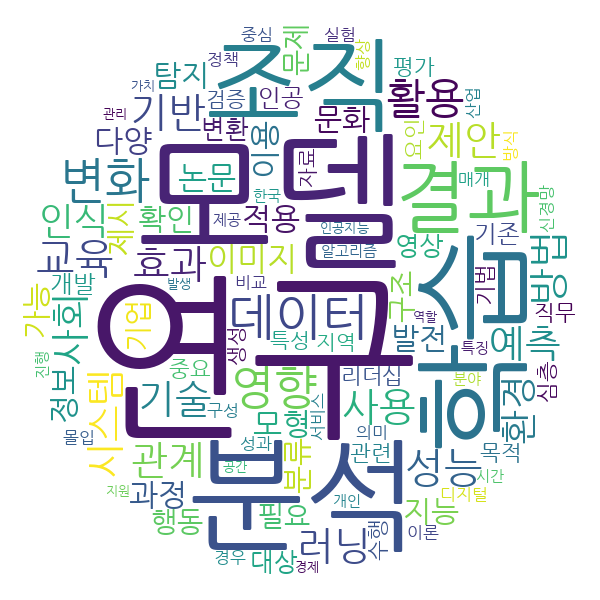

In [ ]:
dtm_df_wc.to_image()

In [ ]:
# ✅ TF-IDF 적용
tv = TfidfVectorizer(max_features=1000)
tf_idf = tv.fit_transform(processed_texts)

In [ ]:
tf_idf_df = pd.DataFrame({
    '단어': tv.get_feature_names_out(),
    'TF-IDF': tf_idf.sum(axis=0).flat
})

In [ ]:
tf_idf_df.sort_values('TF-IDF', ascending=False).head(1000)

,단어,TF-IDF
938,학습,1391.026372
274,모델,1176.499209
765,조직,870.869296
544,연구,864.490726
226,데이터,829.432441
...,...,...
720,전제,22.686963
136,궁극,22.346342
376,비중,22.248067
329,법원,21.938673


In [ ]:
tf_idf_df_dict = tf_idf_df.set_index('단어')['TF-IDF'].to_dict()

In [ ]:
tf_idf_df_dict_wc = wc.fit_words(tf_idf_df_dict)

NameError: name 'wc' is not defined

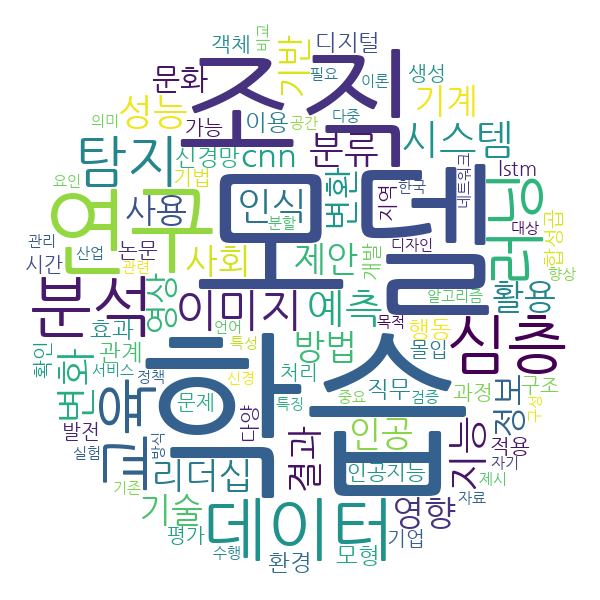

In [ ]:
tf_idf_df_dict_wc.to_image()

In [ ]:
import pickle
import re
from collections import Counter

# 영어 단어만 추출하는 함수
def extract_english_words(text):
    return re.findall(r'\b[a-zA-Z]+\b', text)

# 데이터가 리스트 형태라고 가정하고 처리
all_words = []
if isinstance(processed_texts, list):
    for item in processed_texts:
        if isinstance(item, str):  # 문자열인지 확인
            all_words.extend(extract_english_words(item))

# 단어 빈도 계산
word_counts = Counter(all_words)

# 전체 영어 단어 리스트 (중복 제거 후 정렬)
unique_words = sorted(word_counts.keys())

# 5회 이상 등장한 단어 리스트 (정렬 포함)
frequent_words = sorted([word for word, count in word_counts.items() if count >= 5])

# 결과 출력
print("모든 영어 단어 (중복 제거):", unique_words)
print("5회 이상 등장한 영어 단어:", frequent_words)


모든 영어 단어 (중복 제거): ['A', 'C', 'CNN', 'I', 'IDF', 'K', 'M', 'NP', 'O', 'POP', 'SKY', 'TA', 'TF', 'aa', 'aac', 'aacc', 'aadb', 'aae', 'aai', 'aam', 'aar', 'aaron', 'aasp', 'ab', 'aba', 'abae', 'abaqus', 'abbreviation', 'abc', 'abcd', 'abdomen', 'abdominal', 'abduction', 'abductive', 'abe', 'abenomics', 'abh', 'abhidhamma', 'abhidharmako', 'abilities', 'ability', 'abim', 'abject', 'abl', 'ablation', 'abnomaly', 'abnormal', 'abnormality', 'abolishment', 'abrahams', 'abrasion', 'abs', 'absence', 'absmax', 'absolute', 'absorbing', 'absorptiometry', 'abstract', 'abstracting', 'abstraction', 'absurd', 'absurdity', 'abts', 'abtsa', 'abuse', 'abyss', 'abyssal', 'ac', 'acad', 'academic', 'academy', 'acam', 'acanthopagrus', 'acanthopagus', 'acanthopanax', 'acc', 'acceleration', 'accelerator', 'accelerators', 'accelerometer', 'accent', 'accenture', 'acceptability', 'acceptance', 'acceptanceofnietzscheinrussia', 'access', 'accessibility', 'accident', 'accidents', 'accommodation', 'accord', 'account',

In [ ]:
print("5회 이상 등장한 영어 단어:", frequent_words)

5회 이상 등장한 영어 단어: ['CNN', 'K', 'aacc', 'ability', 'abnormal', 'absolute', 'abstract', 'abts', 'abuse', 'ac', 'academic', 'academy', 'acam', 'acc', 'acceleration', 'accelerator', 'accelerometer', 'acceptance', 'access', 'accident', 'accidents', 'accountability', 'accounting', 'accumulation', 'accuracy', 'ace', 'acetate', 'acf', 'achievement', 'acid', 'acquisition', 'act', 'action', 'actions', 'activation', 'activities', 'activity', 'actor', 'ad', 'ada', 'adaboost', 'adagrad', 'adam', 'adaptability', 'adaptation', 'adaptive', 'adas', 'adasyn', 'adc', 'addiction', 'addie', 'addition', 'additive', 'adjustment', 'adlfm', 'administration', 'administrative', 'adolescents', 'adoption', 'adr', 'ads', 'adsorption', 'adult', 'advanced', 'advantage', 'adversarial', 'advertising', 'advisor', 'advocacy', 'ae', 'aed', 'aerial', 'aes', 'aesthetics', 'affect', 'affective', 'affine', 'afl', 'agd', 'age', 'agency', 'agent', 'agfi', 'aggression', 'agility', 'aging', 'agreement', 'agricultural', 'agricultur

In [ ]:
tokenized_texts = [text.split() for text in processed_texts]  # Word2Vec은 토큰 리스트 필요
w2v_model = Word2Vec(tokenized_texts, window=10, vector_size=300, sg=1, min_count=10)

In [ ]:
w2v_model.wv.vectors.shape

(9815, 300)

In [ ]:
w2v_model.wv.most_similar('순환신경망', topn=30) # '모델'과 연관성이 가장 높은 단어 20개

[('gated', 0.7314751744270325),
 ('gru', 0.7052100896835327),
 ('blstm', 0.7001981139183044),
 ('crnn', 0.6993585228919983),
 ('bidirectional', 0.6982946395874023),
 ('stacked', 0.6902674436569214),
 ('long', 0.683758020401001),
 ('term', 0.6829891800880432),
 ('short', 0.6772100925445557),
 ('unit', 0.673793375492096),
 ('gate', 0.6656616926193237),
 ('temporal', 0.6655982136726379),
 ('tcn', 0.6554684042930603),
 ('sequence', 0.6533113121986389),
 ('regressive', 0.6531630158424377),
 ('dependency', 0.6528226137161255),
 ('bilstm', 0.6516892313957214),
 ('seq', 0.6506425142288208),
 ('hidden', 0.6498465538024902),
 ('connected', 0.6486719846725464),
 ('baseline', 0.6479204297065735),
 ('stacking', 0.6461812257766724),
 ('units', 0.6449267864227295),
 ('tuning', 0.642028272151947),
 ('imputation', 0.6413515210151672),
 ('trajectory', 0.6398112773895264),
 ('particulate', 0.6393612623214722),
 ('svr', 0.6390670537948608),
 ('adaboost', 0.6366978883743286),
 ('광전지', 0.6351779103279114)]

In [ ]:
w2v_model.wv.most_similar('모델', topn=30) # '모델'과 연관성이 가장 높은 단어 20개

[('restaurant', 0.6358153223991394),
 ('stable', 0.6278767585754395),
 ('crm', 0.623788058757782),
 ('credit', 0.6229205131530762),
 ('train', 0.6216855049133301),
 ('valuation', 0.6181171536445618),
 ('search', 0.6178359985351562),
 ('gap', 0.6160390973091125),
 ('evidence', 0.6137326955795288),
 ('skill', 0.6134615540504456),
 ('degree', 0.6117826104164124),
 ('destination', 0.6112434267997742),
 ('foreign', 0.6111849546432495),
 ('maturity', 0.6111732721328735),
 ('advantage', 0.6097461581230164),
 ('era', 0.6091278195381165),
 ('multiple', 0.6088190674781799),
 ('finance', 0.6070382595062256),
 ('competition', 0.6066889762878418),
 ('distribution', 0.606468677520752),
 ('large', 0.605333149433136),
 ('graphics', 0.6051188111305237),
 ('marketing', 0.6049931645393372),
 ('transaction', 0.6038849949836731),
 ('financial', 0.6019424200057983),
 ('firm', 0.5997443795204163),
 ('hidden', 0.5994631052017212),
 ('units', 0.5981726050376892),
 ('companies', 0.5980101227760315),
 ('alignmen

In [ ]:
w2v_model.wv.most_similar('연구', topn=30) # '모델'과 연관성이 가장 높은 단어 20개

[('서베이', 0.52371746301651),
 ('검색어', 0.5182825326919556),
 ('데이타', 0.5169017910957336),
 ('더블', 0.5011811852455139),
 ('활용도', 0.49823346734046936),
 ('블루', 0.49429550766944885),
 ('회선', 0.4938630163669586),
 ('한국연구재단', 0.49284154176712036),
 ('국내·외', 0.4918477535247803),
 ('기하급수', 0.4906289577484131),
 ('색인', 0.4904886484146118),
 ('인사이트', 0.48912423849105835),
 ('클래식', 0.48696455359458923),
 ('방법론', 0.48582106828689575),
 ('물리탐사', 0.48190513253211975),
 ('국내외', 0.48096540570259094),
 ('배양육', 0.4778303802013397),
 ('리서치', 0.4730546772480011),
 ('캔버스', 0.4726107716560364),
 ('헬스', 0.46969032287597656),
 ('차별점', 0.4688068926334381),
 ('경영학', 0.46712571382522583),
 ('파일럿', 0.4670943319797516),
 ('인천공항', 0.46623948216438293),
 ('체크', 0.465101420879364),
 ('저널', 0.46463871002197266),
 ('활용', 0.46447521448135376),
 ('차종', 0.4642837345600128),
 ('매크로', 0.4641382694244385),
 ('부산지역', 0.46358099579811096)]

In [ ]:
w2v_model.wv.most_similar('데이터', topn=30) # '모델'과 연관성이 가장 높은 단어 20개

[('tabular', 0.6979939341545105),
 ('pipeline', 0.6953487396240234),
 ('preprocessing', 0.686995804309845),
 ('semiconductor', 0.6694956421852112),
 ('healthcare', 0.6692836880683899),
 ('tensor', 0.6646251082420349),
 ('treatment', 0.6579450964927673),
 ('search', 0.6551980972290039),
 ('kaggle', 0.6546873450279236),
 ('big', 0.6537740230560303),
 ('graphics', 0.6536900997161865),
 ('thz', 0.6533374786376953),
 ('diseases', 0.6508190035820007),
 ('set', 0.6495497822761536),
 ('leakage', 0.6453710794448853),
 ('acceleration', 0.644320547580719),
 ('불균형', 0.6426789164543152),
 ('sparse', 0.6423088312149048),
 ('electronic', 0.6420825123786926),
 ('데이터셋', 0.6411682963371277),
 ('train', 0.6400392055511475),
 ('training', 0.6392505764961243),
 ('competition', 0.6387003660202026),
 ('small', 0.6382635235786438),
 ('signature', 0.6382463574409485),
 ('pytorch', 0.6379155516624451),
 ('stacking', 0.6368129253387451),
 ('temporal', 0.6362393498420715),
 ('fraud', 0.6360598206520081),
 ('medic

In [ ]:
w2v_model.wv.most_similar('조직', topn=30) # '모델'과 연관성이 가장 높은 단어 20개

[('부서장', 0.6992104649543762),
 ('조직행동', 0.6907517313957214),
 ('구성원', 0.6440970301628113),
 ('테크노스트레스', 0.6437604427337646),
 ('성패', 0.6200640201568604),
 ('차상위', 0.6154058575630188),
 ('아노미', 0.6139126420021057),
 ('직무', 0.61248379945755),
 ('진성', 0.6119520664215088),
 ('자기희생', 0.6119036078453064),
 ('팀장', 0.6007404327392578),
 ('grit', 0.5975782871246338),
 ('인게이지먼트', 0.5969722270965576),
 ('감정지능', 0.5943290591239929),
 ('사교', 0.5938351154327393),
 ('멤버', 0.5906662344932556),
 ('인적자원관리', 0.5901588797569275),
 ('pro', 0.5899347066879272),
 ('경영진', 0.5884841680526733),
 ('마키아벨리즘', 0.5882725715637207),
 ('여행사', 0.5864977836608887),
 ('응집력', 0.585551381111145),
 ('매너리즘', 0.5829265713691711),
 ('상사', 0.5816145539283752),
 ('사회관계', 0.578977108001709),
 ('기회주의', 0.5787621736526489),
 ('통제위치', 0.5776382088661194),
 ('무용단', 0.5771641135215759),
 ('인간관계', 0.5770506262779236),
 ('직속', 0.5769062638282776)]

In [ ]:
w2v_model.wv.most_similar('분석', topn=20) # '모델'과 연관성이 가장 높은 단어 20개

[('중요성', 0.6901392340660095),
 ('tensor', 0.6691880822181702),
 ('opinion', 0.6678094863891602),
 ('search', 0.658225953578949),
 ('sport', 0.64862060546875),
 ('latent', 0.6484280824661255),
 ('디리클레', 0.6478151679039001),
 ('riss', 0.6409862637519836),
 ('pipeline', 0.6406332850456238),
 ('node', 0.6401654481887817),
 ('report', 0.6401270627975464),
 ('bigdata', 0.6386247277259827),
 ('idf', 0.6368533968925476),
 ('nosql', 0.6347272992134094),
 ('valuation', 0.6340368986129761),
 ('transformers', 0.631420910358429),
 ('paper', 0.6306297183036804),
 ('set', 0.6303332448005676),
 ('modeling', 0.6282789707183838),
 ('multimodal', 0.6262287497520447)]

In [ ]:
w2v_model.wv.most_similar('rnn', topn=20) # '모델'과 연관성이 가장 높은 단어 20개

[('gru', 0.7273116111755371),
 ('gated', 0.7162922024726868),
 ('stacked', 0.7025921940803528),
 ('bidirectional', 0.7021998763084412),
 ('unit', 0.6781059503555298),
 ('blstm', 0.6770012974739075),
 ('seq', 0.6748493909835815),
 ('long', 0.6715355515480042),
 ('baseline', 0.6652551293373108),
 ('crnn', 0.6632376313209534),
 ('dependency', 0.6583526134490967),
 ('gate', 0.6525396108627319),
 ('term', 0.6484408378601074),
 ('short', 0.6481629610061646),
 ('tcn', 0.6474773287773132),
 ('knn', 0.646916389465332),
 ('bilstm', 0.6453345417976379),
 ('temporal', 0.6448582410812378),
 ('adaboost', 0.6415801048278809),
 ('particulate', 0.6411991715431213)]

In [ ]:
tokenized_texts = [text.split() for text in processed_texts]  # Word2Vec은 토큰 리스트 필요
w2v_mod = Word2Vec(tokenized_texts, window=30, vector_size=300, sg=1, min_count=234)

In [ ]:
w2v_mod.wv.most_similar('cnn', topn=15) # '모델'과 연관성이 가장 높은 단어 20개

[('분류', 0.5692828297615051),
 ('탐지지', 0.5436489582061768),
 ('레이어', 0.5271791219711304),
 ('multi', 0.5130780339241028),
 ('attention', 0.5069315433502197),
 ('탐지', 0.5045942664146423),
 ('특징', 0.49305152893066406),
 ('컨볼루션', 0.48997756838798523),
 ('이미지', 0.48921525478363037),
 ('트랜스포머', 0.48337066173553467),
 ('분석', 0.48253706097602844),
 ('영상', 0.48056143522262573),
 ('resnet', 0.47489017248153687),
 ('yolo', 0.473417192697525),
 ('lstm', 0.47231918573379517)]

In [ ]:
w2v_model.wv.most_similar('usage', topn=15) # '모델'과 연관성이 가장 높은 단어 20개

[('chart', 0.9198042154312134),
 ('ami', 0.9193930625915527),
 ('bayesian', 0.911145806312561),
 ('operations', 0.9106672406196594),
 ('reverse', 0.9096496105194092),
 ('distributed', 0.9096213579177856),
 ('electricity', 0.9077595472335815),
 ('component', 0.9074671864509583),
 ('hyperband', 0.9069163799285889),
 ('fuzzy', 0.9064780473709106),
 ('side', 0.9063385128974915),
 ('predictive', 0.9039429426193237),
 ('hidden', 0.9032127857208252),
 ('description', 0.9027198553085327),
 ('moving', 0.8990990519523621)]

In [ ]:
!apt-get update -qq
!apt-get install fonts-nanum* -qq

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package fonts-nanum.
(Reading database ... 124926 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Selecting previously unselected package fonts-nanum-coding.
Preparing to unpack .../fonts-nanum-coding_2.5-3_all.deb ...
Unpacking fonts-nanum-coding (2.5-3) ...
Selecting previously unselected package fonts-nanum-eco.
Preparing to unpack .../fonts-nanum-eco_1.000-7_all.deb ...
Unpacking fonts-nanum-eco (1.000-7) ...
Selecting previously unselected package fonts-nanum-extra.
Preparing to unpack .../fonts-nanum-extra_20200506-1_all.deb ...
Unpacking fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Setting up fo

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import font_manager as fm
from matplotlib import rc
import os

# 나눔고딕 폰트 경로
font_path = "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"

# 폰트가 설치되었는지 확인
if not os.path.exists(font_path):
    raise FileNotFoundError("NanumGothic 폰트가 설치되지 않았습니다.")

# 폰트 설정
fm.fontManager.addfont(font_path)
font_prop = fm.FontProperties(fname=font_path)

plt.rc("font", family=font_prop.get_name())
plt.rcParams["axes.unicode_minus"] = False  # 마이너스 기호 깨짐 방지

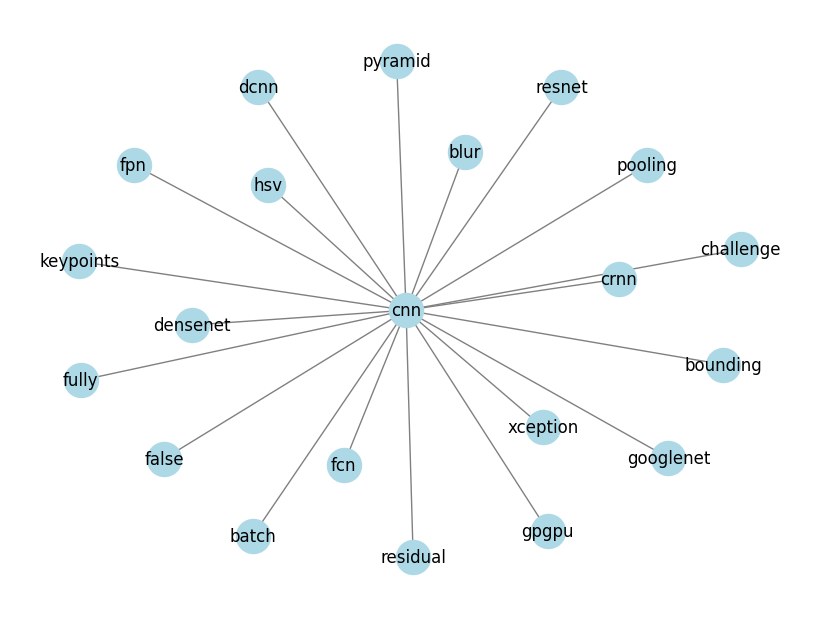

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from gensim.models import Word2Vec

# 특정 단어 지정
target_word = "cnn"  # 원하는 단어로 변경

# 유사한 단어 찾기
similar_words = w2v_model.wv.most_similar(target_word, topn=20)

# 그래프 초기화
G = nx.Graph()

# 노드 추가
G.add_node(target_word)

for word, similarity in similar_words:
    G.add_node(word)  # 유사한 단어 추가
    G.add_edge(target_word, word, weight=similarity)  # 엣지 추가

# 그래프 시각화
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # 노드 위치 결정
nx.draw(G, pos, with_labels=True, node_color="lightblue", edge_color="gray", font_size=12, node_size=600)

# 엣지에 유사도 가중치 표시
#edge_labels = {(target_word, word): f"{similarity:.2f}" for word, similarity in similar_words}
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

#plt.title(f"Word2Vec Network for '{target_word}'")
plt.show()


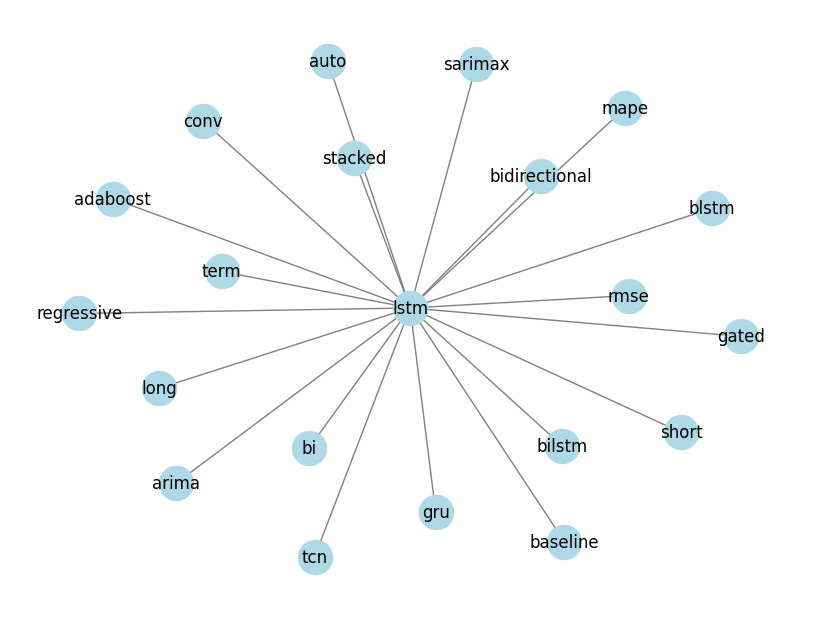

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from gensim.models import Word2Vec

# 특정 단어 지정
target_word = "lstm"  # 원하는 단어로 변경

# 유사한 단어 찾기
similar_words = w2v_model.wv.most_similar(target_word, topn=20)

# 그래프 초기화
G = nx.Graph()

# 노드 추가
G.add_node(target_word)

for word, similarity in similar_words:
    G.add_node(word)  # 유사한 단어 추가
    G.add_edge(target_word, word, weight=similarity)  # 엣지 추가

# 그래프 시각화
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # 노드 위치 결정
nx.draw(G, pos, with_labels=True, node_color="lightblue", edge_color="gray", font_size=12, node_size=600)

# 엣지에 유사도 가중치 표시
#edge_labels = {(target_word, word): f"{similarity:.2f}" for word, similarity in similar_words}
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

#plt.title(f"Word2Vec Network for '{target_word}'")
plt.show()


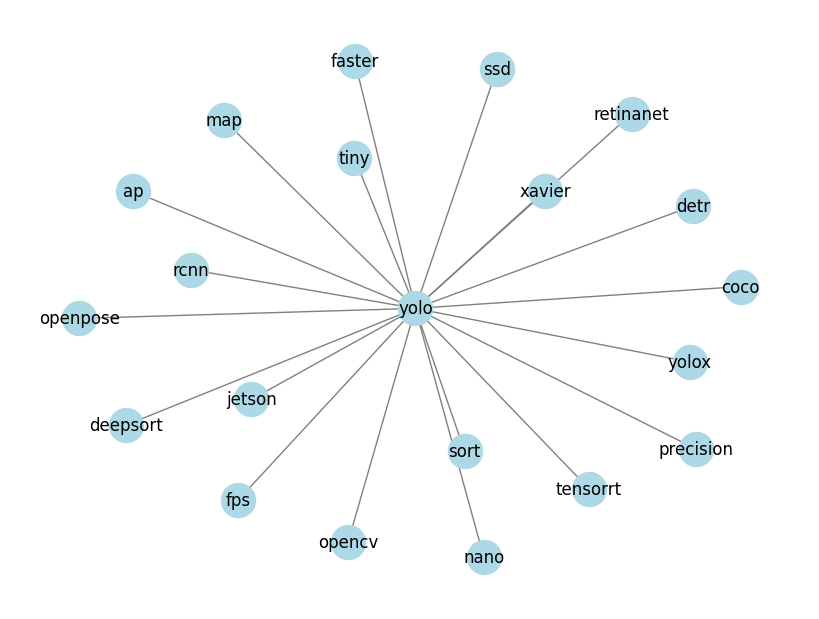

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from gensim.models import Word2Vec

# 특정 단어 지정
target_word = "yolo"  # 원하는 단어로 변경

# 유사한 단어 찾기
similar_words = w2v_model.wv.most_similar(target_word, topn=20)

# 그래프 초기화
G = nx.Graph()

# 노드 추가
G.add_node(target_word)

for word, similarity in similar_words:
    G.add_node(word)  # 유사한 단어 추가
    G.add_edge(target_word, word, weight=similarity)  # 엣지 추가

# 그래프 시각화
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # 노드 위치 결정
nx.draw(G, pos, with_labels=True, node_color="lightblue", edge_color="gray", font_size=12, node_size=600)

# 엣지에 유사도 가중치 표시
#edge_labels = {(target_word, word): f"{similarity:.2f}" for word, similarity in similar_words}
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

#plt.title(f"Word2Vec Network for '{target_word}'")
plt.show()


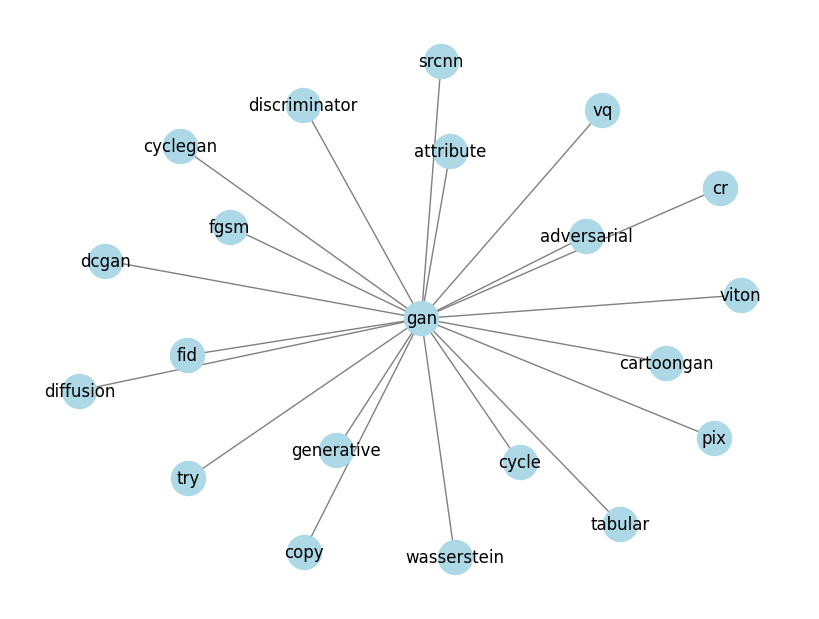

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from gensim.models import Word2Vec

# 특정 단어 지정
target_word = "gan"  # 원하는 단어로 변경

# 유사한 단어 찾기
similar_words = w2v_model.wv.most_similar(target_word, topn=20)

# 그래프 초기화
G = nx.Graph()

# 노드 추가
G.add_node(target_word)

for word, similarity in similar_words:
    G.add_node(word)  # 유사한 단어 추가
    G.add_edge(target_word, word, weight=similarity)  # 엣지 추가

# 그래프 시각화
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # 노드 위치 결정
nx.draw(G, pos, with_labels=True, node_color="lightblue", edge_color="gray", font_size=12, node_size=600)

# 엣지에 유사도 가중치 표시
#edge_labels = {(target_word, word): f"{similarity:.2f}" for word, similarity in similar_words}
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

#plt.title(f"Word2Vec Network for '{target_word}'")
plt.show()


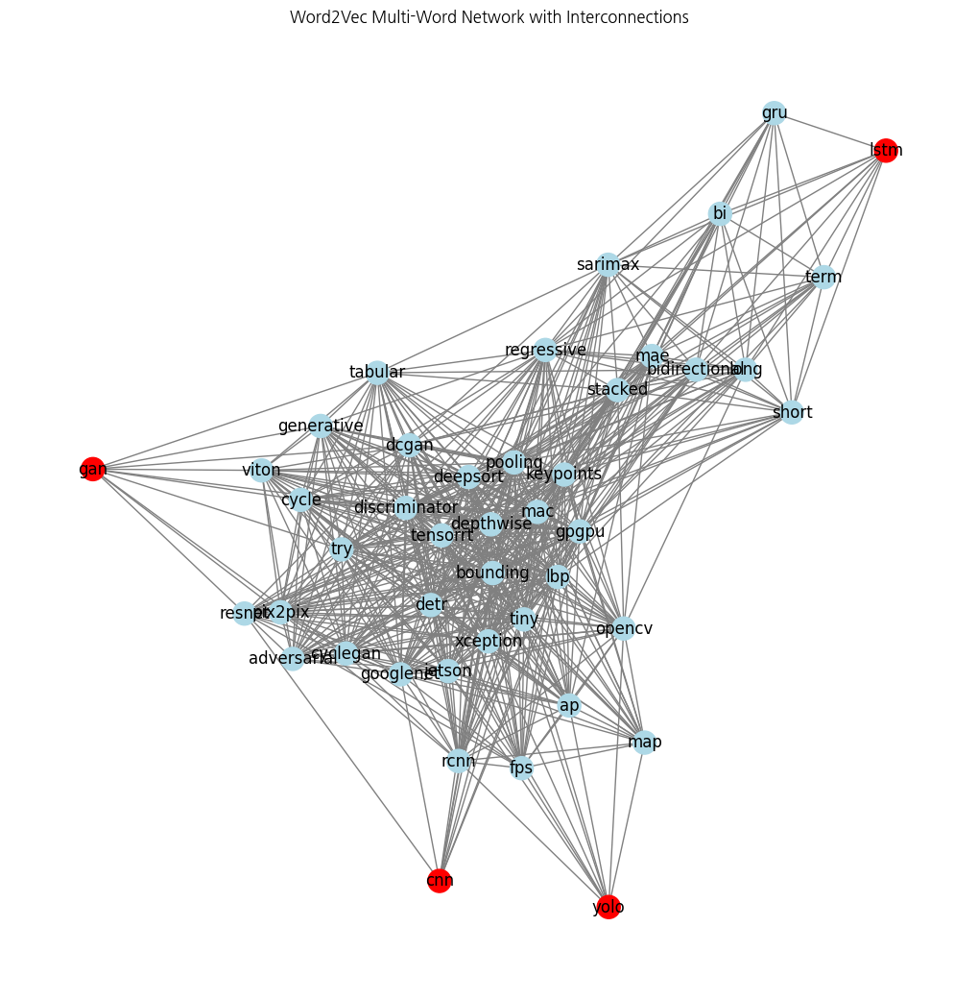

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations

# 기준이 될 단어 4개 설정
target_words = ["cnn", "lstm", "yolo", "gan"]  # 원하는 단어로 변경

# 그래프 초기화
G = nx.Graph()

# 기준 단어들의 색상을 빨간색으로 설정
node_colors = {}

# 1️⃣ 모든 기준 단어 추가 (빨간색)
for target_word in target_words:
    G.add_node(target_word)
    node_colors[target_word] = "red"

# 2️⃣ 각 기준 단어마다 유사한 단어 추가 및 연결
word_groups = {}  # {기준 단어: [유사 단어 리스트]} 저장

for target_word in target_words:
    similar_words = w2v_model.wv.most_similar(target_word, topn=10)  # 유사 단어 5개씩
    word_groups[target_word] = [word for word, _ in similar_words]  # 리스트 저장

    for word, similarity in similar_words:
        G.add_node(word)  # 유사한 단어 추가
        node_colors[word] = "lightblue"  # 기본 색상은 파란색
        G.add_edge(target_word, word, weight=similarity)  # 기준 단어와 연결

# 3️⃣ 생성된 유사한 단어들끼리도 연결 (유사도가 0.6 이상인 경우)
all_words = set(sum(word_groups.values(), []))  # 모든 유사 단어 리스트

for word1, word2 in combinations(all_words, 2):  # 유사한 단어들끼리 조합
    if word1 in w2v_model.wv and word2 in w2v_model.wv:
        similarity = w2v_model.wv.similarity(word1, word2)
        if similarity > 0.6:  # 임계값(0.5) 이상이면 연결
            G.add_edge(word1, word2, weight=similarity)

# 4️⃣ 그래프 시각화
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G)  # 노드 위치 설정
nx.draw(G, pos, with_labels=True, node_color=[node_colors[node] for node in G.nodes],
        edge_color="gray", font_size=12, node_size=300)

# 엣지에 유사도 가중치 표시
#edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)}
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Word2Vec Multi-Word Network with Interconnections")
plt.show()
nx.write_gexf(G, "network_graph.gexf")

In [ ]:
import pandas as pd

# 기준 단어 리스트
target_words = ["cnn", "lstm", "yolo", "gan"]

# 노드 데이터 저장용 리스트
nodes = []
edges = []

# 기준 단어 추가 (노드)
for word in target_words:
    nodes.append([word, "main"])  # "main" 카테고리 추가

# 유사한 단어 추가 및 연결 (엣지)
word_groups = {}
for word in target_words:
    similar_words = w2v_model.wv.most_similar(word, topn=10)
    word_groups[word] = [w[0] for w in similar_words]

    for similar_word, similarity in similar_words:
        nodes.append([similar_word, "similar"])  # "similar" 카테고리 추가
        edges.append([word, similar_word, similarity])  # (source, target, weight)

# 유사한 단어들끼리도 연결
all_words = set(sum(word_groups.values(), []))
for word1 in all_words:
    for word2 in all_words:
        if word1 != word2 and word1 in w2v_model.wv and word2 in w2v_model.wv:
            similarity = w2v_model.wv.similarity(word1, word2)
            if similarity >= 0.6:  # 유사도가 높으면 엣지 추가
                edges.append([word1, word2, similarity])

# DataFrame으로 변환 후 CSV 저장
nodes_df = pd.DataFrame(nodes, columns=["Id", "Category"])
edges_df = pd.DataFrame(edges, columns=["Source", "Target", "Weight"])

nodes_df.to_csv("nodes.csv", index=False, encoding="utf-8")
edges_df.to_csv("edges.csv", index=False, encoding="utf-8")

print("CSV 파일 저장 완료: nodes.csv, edges.csv")


CSV 파일 저장 완료: nodes.csv, edges.csv


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
top_words = tf_idf_df.sort_values(by='TF-IDF', ascending=False).head(200)['단어'].tolist()
word_vectors = np.array([w2v_model.wv[word] for word in top_words if word in w2v_model.wv])
similarity_matrix = cosine_similarity(word_vectors)

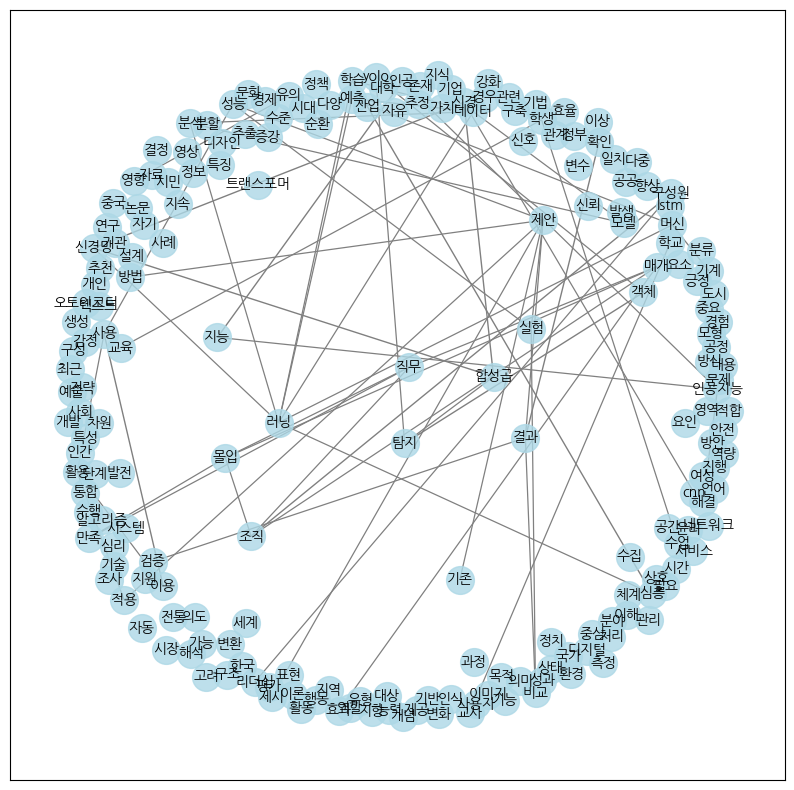

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

G = nx.Graph()

# 노드 추가
for word in top_words:
    if word in w2v_model.wv:
        G.add_node(word)

# 엣지 추가 (유사도가 0.5 이상인 경우만 연결)
threshold = 0.5
for i in range(len(top_words)):
    for j in range(i + 1, len(top_words)):
        if top_words[i] in w2v_model.wv and top_words[j] in w2v_model.wv:
            sim = cosine_similarity([w2v_model.wv[top_words[i]]], [w2v_model.wv[top_words[j]]])[0, 0]
            if sim > threshold:
                G.add_edge(top_words[i], top_words[j], weight=sim)

# 시각화
plt.figure(figsize=(10, 10))

# 노드 위치 조정
pos = nx.spring_layout(G, seed=42, k=0.9)  # k 값을 증가시켜 노드 간 거리 확보
#pos = nx.fruchterman_reingold_layout(G, seed=42)  # 이 옵션도 시도 가능
#pos = nx.kamada_kawai_layout(G)
#pos = nx.circular_layout(G)


edges = G.edges(data=True)

nx.draw_networkx_nodes(G, pos, node_size=400, node_color="lightblue", alpha=0.8)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="NanumGothic")  # 배경 박스로 가독성 개선
#bbox=dict(facecolor="white", alpha=0.6)

# 엣지 스타일 적용
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if w["weight"] > 0.6], width=1, edge_color="gray")
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if 0.5 < w["weight"] <= 0.6], width=0.9, edge_color="gray")

#plt.title("TF-IDF 기반 단어 네트워크", fontsize=15)
plt.show()
nx.write_gexf(G, "network_graph.gexf")

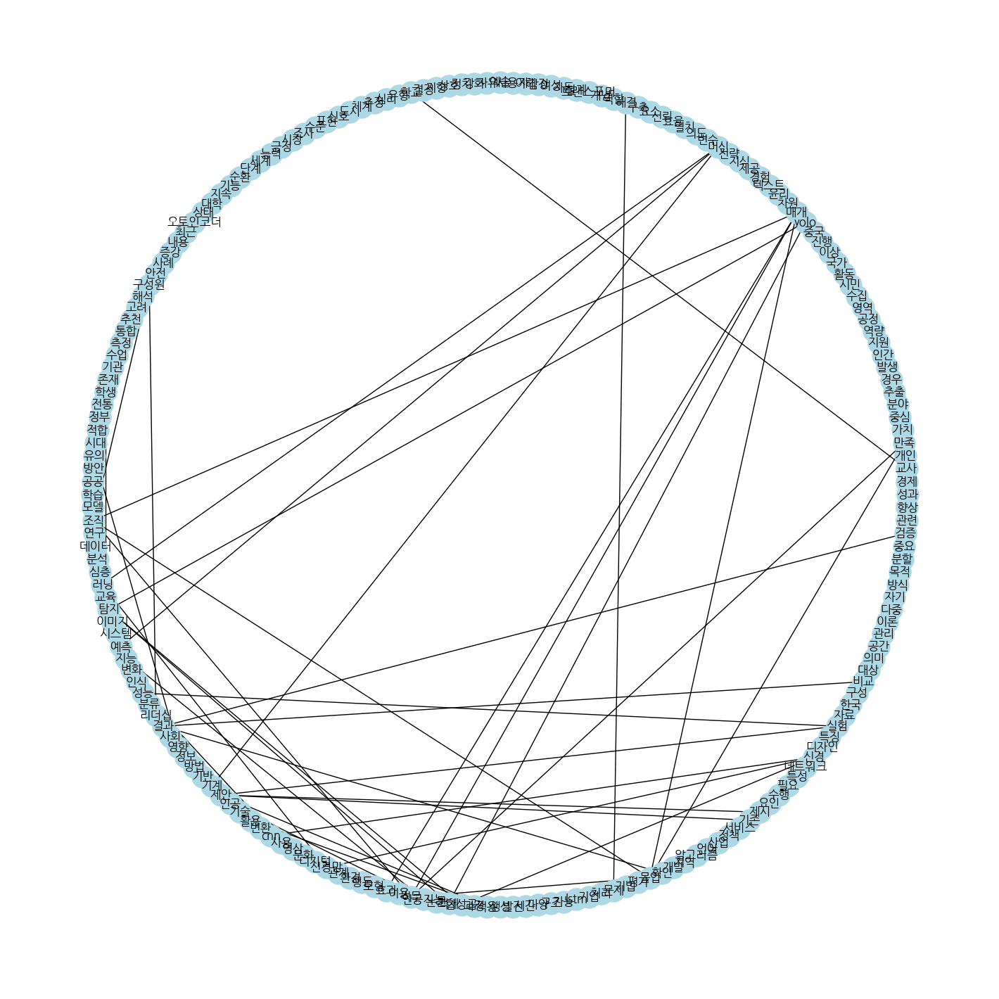

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 14))
pos = nx.shell_layout(G)  # 방사형 배치
nx.draw(G, pos, with_labels=True, node_size=500, node_color="lightblue", font_family="NanumGothic")
plt.show()


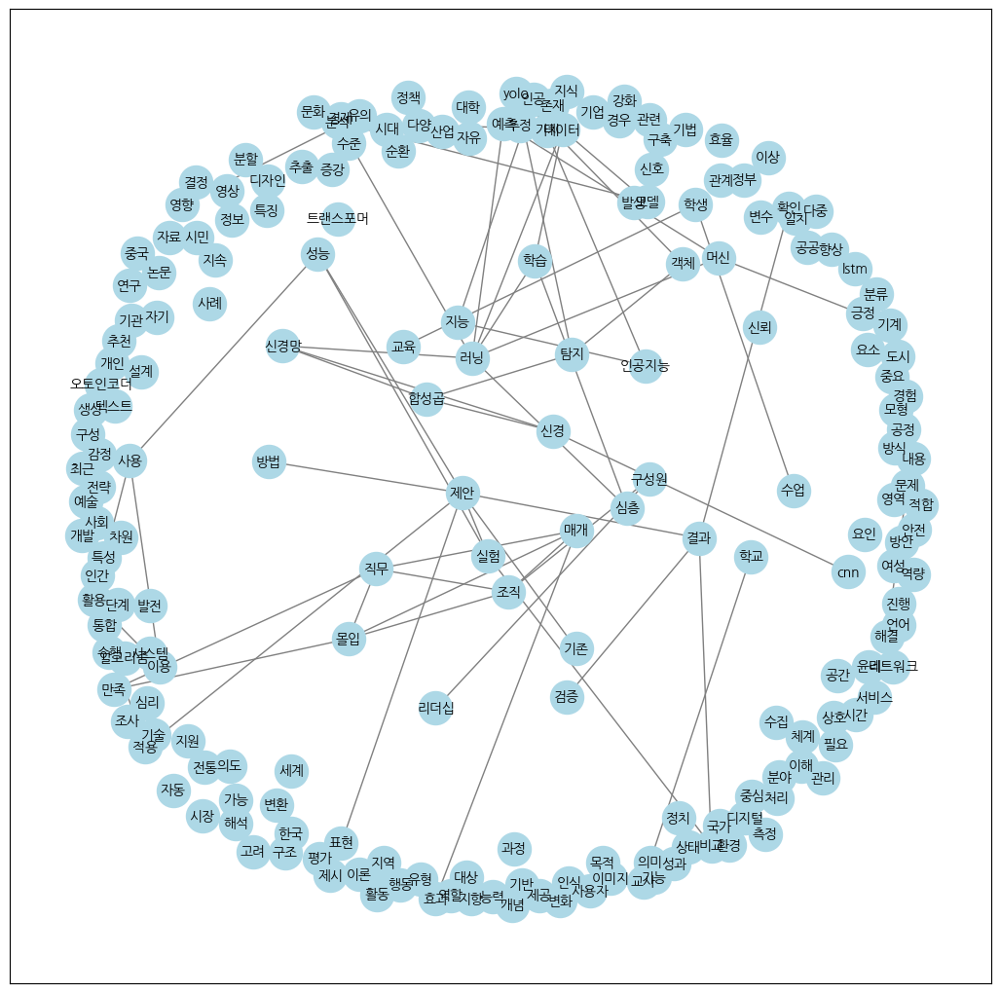

In [ ]:
G = nx.Graph()

# 노드 추가
for word in top_words:
    if word in w2v_model.wv:
        G.add_node(word)

# 엣지 추가 (유사도가 0.5 이상인 경우만 연결)
threshold = 0.5
for i in range(len(top_words)):
    for j in range(i + 1, len(top_words)):
        if top_words[i] in w2v_model.wv and top_words[j] in w2v_model.wv:
            sim = cosine_similarity([w2v_model.wv[top_words[i]]], [w2v_model.wv[top_words[j]]])[0, 0]
            if sim > threshold:
                G.add_edge(top_words[i], top_words[j], weight=sim)

# 시각화
plt.figure(figsize=(13, 13))
pos = nx.spring_layout(G, seed=42, k=0.5)  # 노드 배치
#pos = nx.fruchterman_reingold_layout(G)
edges = G.edges(data=True)

nx.draw_networkx_nodes(G, pos, node_size=600, node_color="lightblue")
nx.draw_networkx_labels(G, pos, font_size=10, font_family="NanumGothic")  # 한글 폰트
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if w["weight"] > 0.6], width=1, edge_color="gray")
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if 0.5 < w["weight"] <= 0.6], width=1, edge_color="gray")

#plt.title("TF-IDF 기반 상위 30개 단어 네트워크", fontsize=15)
plt.show()


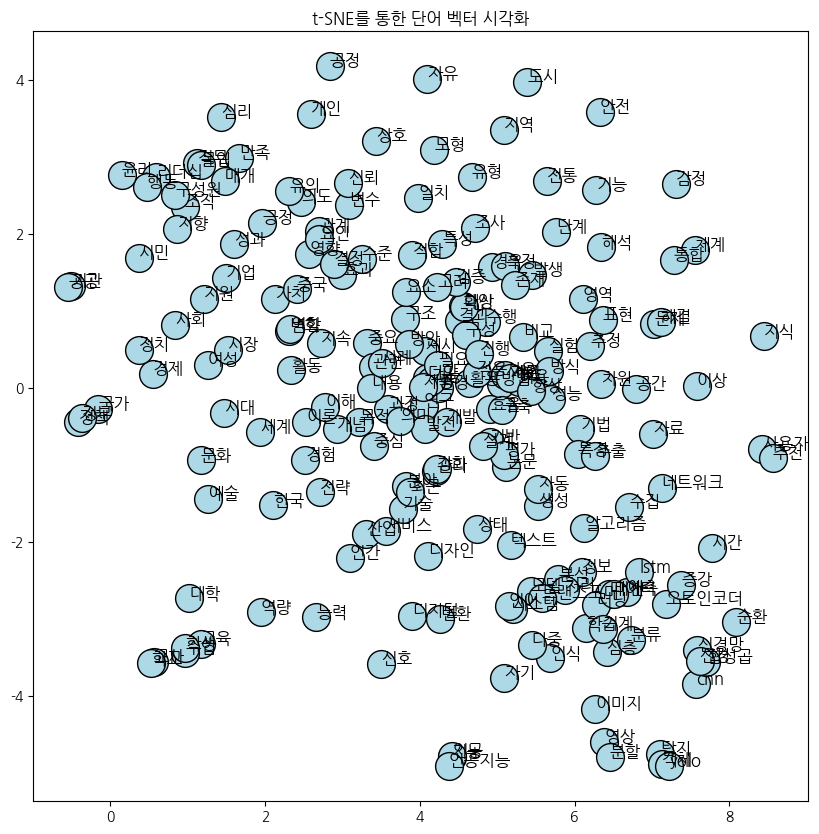

In [ ]:
from sklearn.manifold import TSNE

# t-SNE로 차원 축소 (2D)
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(word_vectors)

# 2D 차원으로 변환된 결과를 시각화
plt.figure(figsize=(10, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c="lightblue", edgecolors='k', s=400)

for i, word in enumerate(top_words):
    if word in w2v_model.wv:
        plt.annotate(word, (tsne_result[i, 0], tsne_result[i, 1]), fontfamily="NanumGothic", fontsize=12)

plt.title("t-SNE를 통한 단어 벡터 시각화")
plt.show()


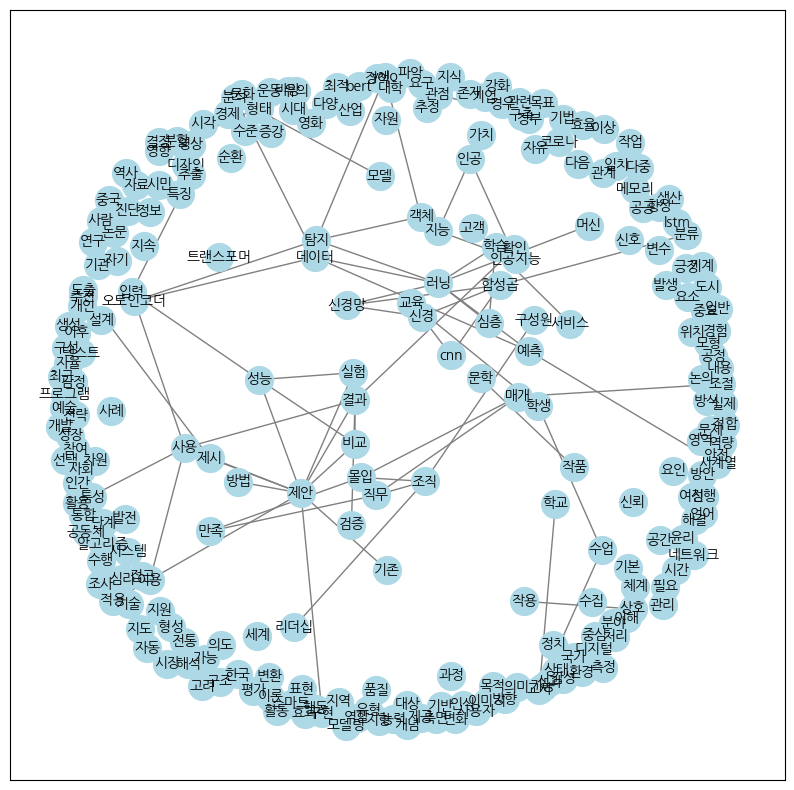

In [ ]:
G = nx.Graph()

# 노드 추가
for word in top_words:
    if word in w2v_model.wv:
        G.add_node(word)

# 엣지 추가 (유사도가 0.5 이상인 경우만 연결)
threshold = 0.5
for i in range(len(top_words)):
    for j in range(i + 1, len(top_words)):
        if top_words[i] in w2v_model.wv and top_words[j] in w2v_model.wv:
            sim = cosine_similarity([w2v_model.wv[top_words[i]]], [w2v_model.wv[top_words[j]]])[0, 0]
            if sim > threshold:
                G.add_edge(top_words[i], top_words[j], weight=sim)

# 시각화
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G, seed=42, k=0.35)  # 노드 배치
edges = G.edges(data=True)

nx.draw_networkx_nodes(G, pos, node_size=400, node_color="lightblue")
nx.draw_networkx_labels(G, pos, font_size=10, font_family="NanumGothic")  # 한글 폰트
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if w["weight"] > 0.6], width=1, edge_color="gray")
nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, w in edges if 0.5 < w["weight"] <= 0.6], width=1, edge_color="gray")

#plt.title("TF-IDF 기반 상위 30개 단어 네트워크", fontsize=15)
plt.show()


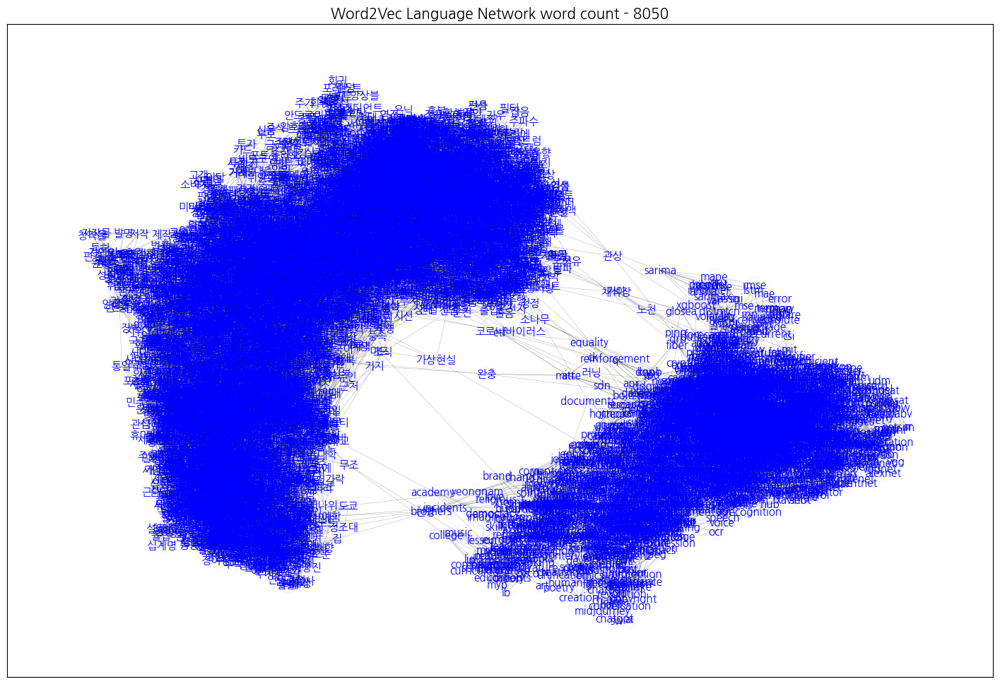

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import networkx as nx
import os

# 폰트 경로
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
if not os.path.exists(font_path):
    raise FileNotFoundError(f"Font file not found: {font_path}")

# 폰트 등록
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()

# 폰트 설정
font_prop = font_manager.FontProperties(fname=font_path)
font_manager.fontManager.addfont(font_path)
rc('font', family=font_prop.get_name())

plt.rcParams['font.family'] = font_name
plt.rcParams['axes.unicode_minus'] = False

# 만약 sans-serif 계열로도 지정하고 싶다면 추가
plt.rcParams['font.sans-serif'] = [font_name]

# 혹은 rc()로 지정해도 됨
# rc('font', family=font_name)
# rc('axes', unicode_minus=False)

def create_language_network(model, topn=10):
    G = nx.Graph()
    words = list(model.wv.index_to_key)
    for word in words:
        try:
            similar_words = model.wv.most_similar(word, topn=topn)
            for sw, sim in similar_words:
                G.add_edge(word, sw, weight=sim)
        except KeyError:
            continue
    return G

# 네트워크 생성
G = create_language_network(w2v_model, topn=5)

plt.figure(figsize=(18, 12))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=300, node_color='black', alpha=0.01)
nx.draw_networkx_edges(G, pos, width=0.3, alpha=0.35)
nx.draw_networkx_labels(G, pos, font_size=11, font_color='b')
plt.title(f'Word2Vec Language Network word count - {len(G.nodes)}', fontsize=15)
plt.show()

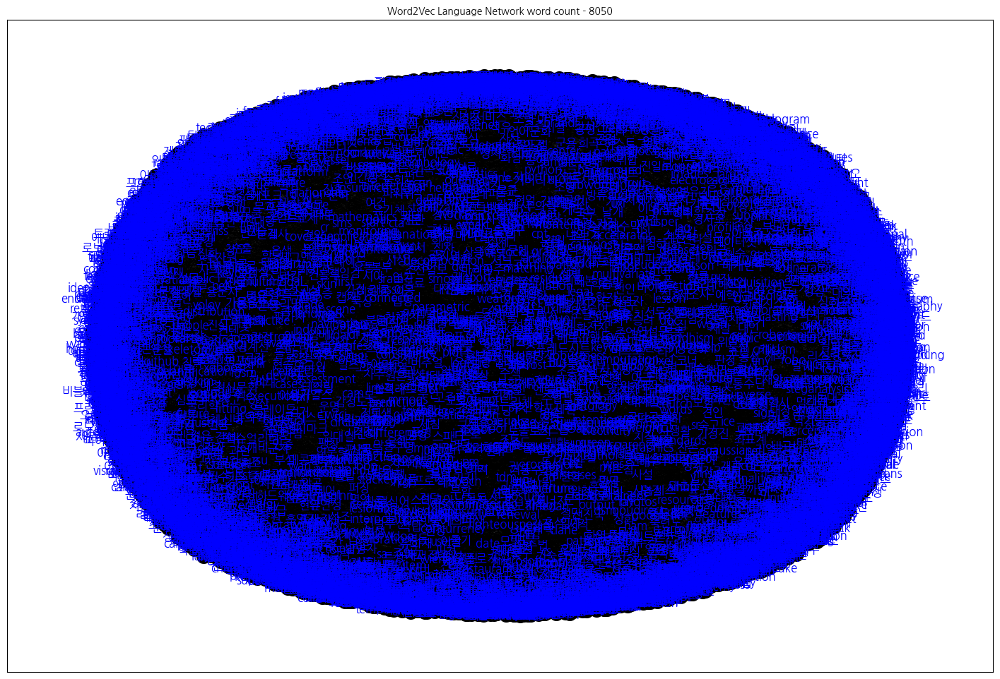

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import networkx as nx
import os

# 폰트 경로 설정
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
if not os.path.exists(font_path):
    raise FileNotFoundError(f"Font file not found: {font_path}")

# 폰트 등록
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()

# 폰트 설정
font_prop = font_manager.FontProperties(fname=font_path)
font_manager.fontManager.addfont(font_path)
rc('font', family=font_prop.get_name())

plt.rcParams['font.family'] = font_name
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.sans-serif'] = [font_name]

def create_language_network(model, topn=10):
    G = nx.Graph()
    words = list(model.wv.index_to_key)
    for word in words:
        try:
            similar_words = model.wv.most_similar(word, topn=topn)
            for sw, sim in similar_words:
                G.add_edge(word, sw, weight=sim)
        except KeyError:
            continue
    return G

# 네트워크 생성
G = create_language_network(w2v_model, topn=5)

# `spring_layout`의 `k` 파라미터를 조정해 간격을 늘림
plt.figure(figsize=(18, 12))

# `k`를 조정하여 노드들 간의 간격을 크게 설정
pos = nx.spring_layout(G, seed=42, k=0.5)

# 노드 및 엣지 그리기
nx.draw_networkx_nodes(G, pos, node_size=200, node_color='black', alpha=1)
nx.draw_networkx_edges(G, pos, width=0.3, alpha=0.35)
nx.draw_networkx_labels(G, pos, font_size=12, font_color='b')

plt.title(f'Word2Vec Language Network word count - {len(G.nodes)}', fontsize=10)
plt.show()


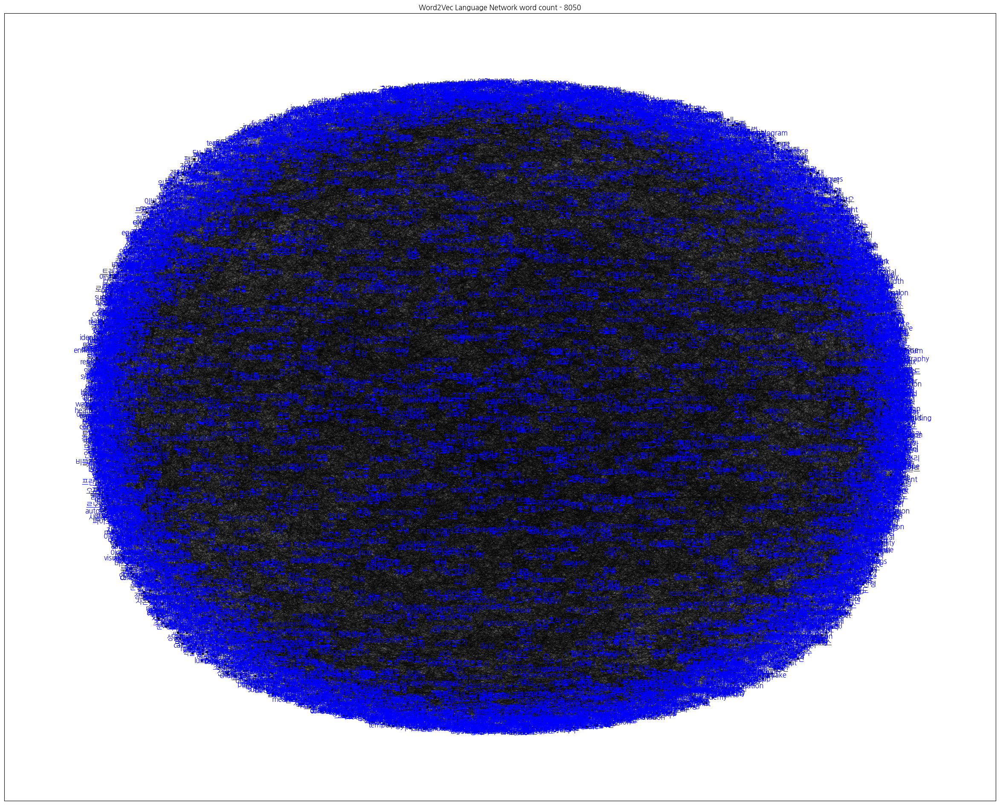

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import networkx as nx
import os

# 폰트 경로 설정
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
if not os.path.exists(font_path):
    raise FileNotFoundError(f"Font file not found: {font_path}")

# 폰트 등록
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()

# 폰트 설정
font_prop = font_manager.FontProperties(fname=font_path)
font_manager.fontManager.addfont(font_path)
rc('font', family=font_prop.get_name())

plt.rcParams['font.family'] = font_name
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.sans-serif'] = [font_name]

def create_language_network(model, topn=10):
    G = nx.Graph()
    words = list(model.wv.index_to_key)
    for word in words:
        try:
            similar_words = model.wv.most_similar(word, topn=topn)
            for sw, sim in similar_words:
                G.add_edge(word, sw, weight=sim)
        except KeyError:
            continue
    return G

# 네트워크 생성
G = create_language_network(w2v_model, topn=5)

# `spring_layout`의 `k` 파라미터를 조정해 간격을 늘림
plt.figure(figsize=(30, 24))

# `k`를 조정하여 노드들 간의 간격을 크게 설정
pos = nx.spring_layout(G, seed=42, k=0.5)

# 노드 및 엣지 그리기
nx.draw_networkx_nodes(G, pos, node_size=10, node_color='black', alpha=1)
nx.draw_networkx_edges(G, pos, width=0.3, alpha=0.35)
nx.draw_networkx_labels(G, pos, font_size=12, font_color='b')

plt.title(f'Word2Vec Language Network word count - {len(G.nodes)}', fontsize=12)
plt.show()


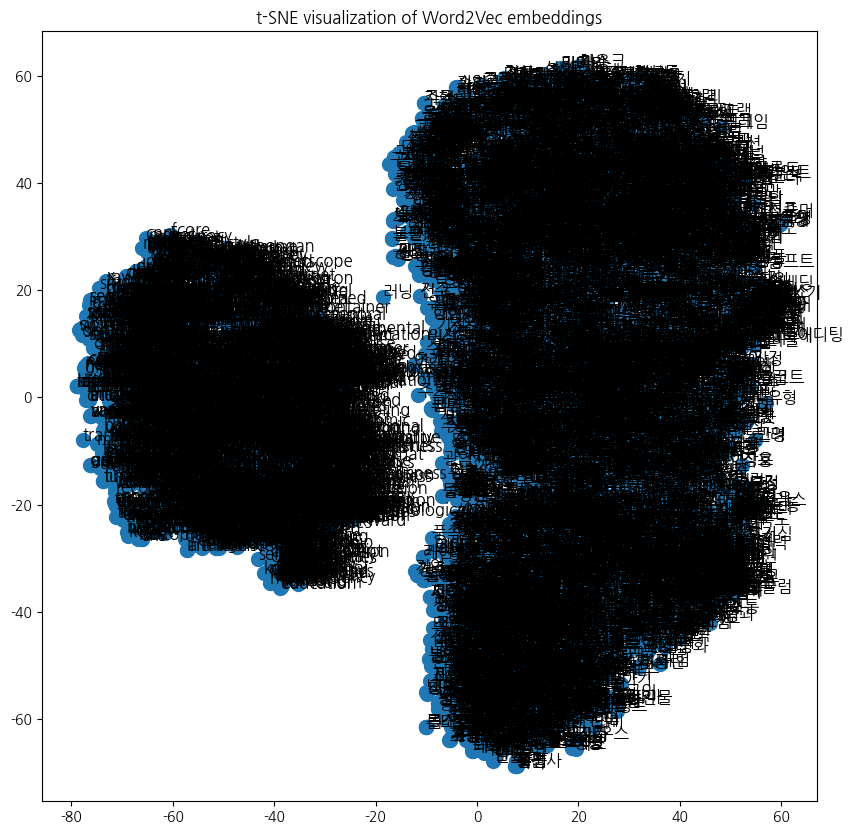

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# 🔹 Word2Vec 모델로부터 단어 벡터와 해당 단어 리스트 가져오기
words = list(w2v_model.wv.index_to_key)  # 단어 목록
word_vectors = np.array([w2v_model.wv[word] for word in words])  # 각 단어에 대한 벡터

# 🔹 t-SNE를 사용하여 2D 벡터로 차원 축소
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(word_vectors)

# 🔹 t-SNE 결과 시각화
plt.figure(figsize=(10, 10))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], marker='o', s=100)

# 🔹 단어 레이블 추가
for i, word in enumerate(words):
    plt.annotate(word, (tsne_results[i, 0], tsne_results[i, 1]), fontsize=12)

plt.title("t-SNE visualization of Word2Vec embeddings")
plt.show()